We will now import all the libraries needed for training process. It will use Tensorflow backend and keras at frontend.

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random
import warnings
warnings.filterwarnings("ignore")

C:\Users\VIVEK VARDHAN\anaconda3\envs\myenv\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


We wil use dir as the name given to the folder itself and take the parameters itself. Using head, we will show the first five values for the CSV on the desired formatWe wil use datadir as the name given to the folder itself and take the parameters itself. Using head, we will show the first five values for the CSV on the desired format

In [4]:
dir = r"C:\Users\VIVEK VARDHAN\Desktop\Driving_car_project"
columns = ["center", "left", "right", "steering", "throttle", "reverse", "speed"]
data = pd.read_csv(os.path.join(dir,"driving_log.csv"),names = columns)
pd.set_option("display.max_colwidth",None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\center_2025_06_30_22_28_47_412.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\left_2025_06_30_22_28_47_412.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\right_2025_06_30_22_28_47_412.jpg,0.0,0.0,0.0,0.000023
1,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\center_2025_06_30_22_28_47_517.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\left_2025_06_30_22_28_47_517.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\right_2025_06_30_22_28_47_517.jpg,0.0,0.0,0.0,0.000026
2,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\center_2025_06_30_22_28_47_618.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\left_2025_06_30_22_28_47_618.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\right_2025_06_30_22_28_47_618.jpg,0.0,0.0,0.0,0.000024
3,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\center_2025_06_30_22_28_47_720.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\left_2025_06_30_22_28_47_720.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\right_2025_06_30_22_28_47_720.jpg,0.0,0.0,0.0,0.000023
4,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\center_2025_06_30_22_28_47_825.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\left_2025_06_30_22_28_47_825.jpg,C:\Users\VIVEK VARDHAN\Downloads\simulator-windows-64\data\IMG\right_2025_06_30_22_28_47_825.jpg,0.0,0.0,0.0,0.000022


In [45]:
total_images = len(data) * 3
print("Total number of images:", total_images)

Total number of images: 4923



As this is picking up the entire path from the local machine, we need to use ntpath function to get the network path assigned. We will declare a name path_leaf and assign accordingly.

In [5]:
def pathleaf(path):
    head,tail = ntpath.split(path)
    return tail

data["center"] = data["center"].apply(pathleaf)
data["left"] = data["left"].apply(pathleaf)
data["right"] = data["right"].apply(pathleaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2025_06_30_22_28_47_412.jpg,left_2025_06_30_22_28_47_412.jpg,right_2025_06_30_22_28_47_412.jpg,0.0,0.0,0.0,0.000023
1,center_2025_06_30_22_28_47_517.jpg,left_2025_06_30_22_28_47_517.jpg,right_2025_06_30_22_28_47_517.jpg,0.0,0.0,0.0,0.000026
2,center_2025_06_30_22_28_47_618.jpg,left_2025_06_30_22_28_47_618.jpg,right_2025_06_30_22_28_47_618.jpg,0.0,0.0,0.0,0.000024
3,center_2025_06_30_22_28_47_720.jpg,left_2025_06_30_22_28_47_720.jpg,right_2025_06_30_22_28_47_720.jpg,0.0,0.0,0.0,0.000023
4,center_2025_06_30_22_28_47_825.jpg,left_2025_06_30_22_28_47_825.jpg,right_2025_06_30_22_28_47_825.jpg,0.0,0.0,0.0,0.000022



We will bin the number of values where the number will be equal to 25 (odd number aimed to get center distribution). We will see the histogram using the np.histogram option on data frame ‘steering’, we will divide it to the number of bins. We keep samples at 400 and then we draw a line. We see the data is centered along the middle that is 0.

In [6]:
num_bins = 25
samples_per_bin = 400
hist,bins = np.histogram(data["steering"],num_bins)
print(bins)

[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92  1.  ]


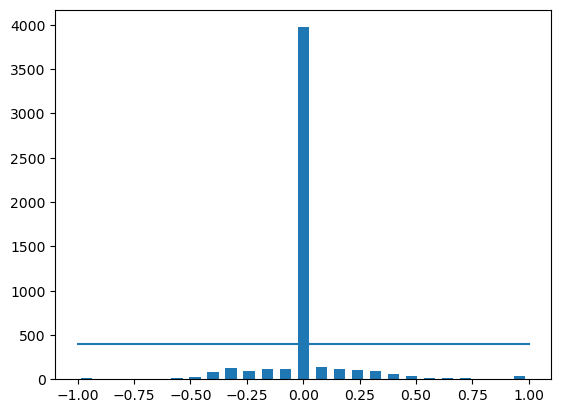

In [7]:
center =( bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)
plt.plot(
    (np.min(data["steering"]),np.max(data["steering"])),
    (samples_per_bin,samples_per_bin),
)

In [8]:
print("Total Data:",len(data))

Total Data: 5214


We will specify a variable remove_list.We will specify samples we want to remove using looping construct through every single bin we will iterate through all the steering data. We will shuffle the data and romve some from it as it is now uniformly structured after shuffling.The output will be the distribution of steering angle that are much more uniform. There are significant amount of left steering angle and right steering angle eliminating the bias to drive straight all the time.

In [9]:
remove_list=[]
for j in range(num_bins):
    list_=[]
    for i in range(len(data["steering"])):
        if data["steering"][i] >= bins[j] and data["steering"][i] <= bins[j+1]:
            list_.append(i)
    list = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)
print("Removed:",len(remove_list))

Removed: 3573


In [10]:
data.drop(data.index[remove_list],inplace = True)

In [11]:
print("Remaining:",len(data))

Remaining: 1641


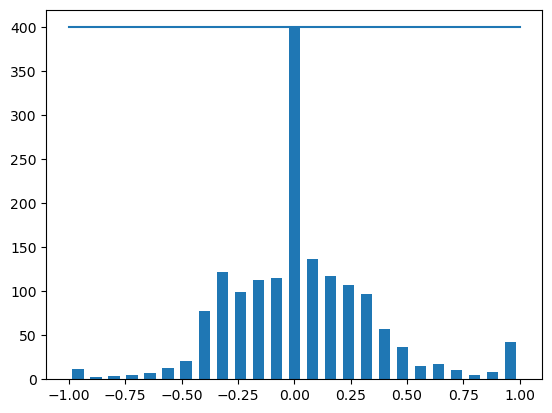

In [12]:
hist,bins= np.histogram(data["steering"],num_bins)
plt.bar(center,hist,width=0.05)
plt.plot(
    (np.min(data["steering"]),np.max(data["steering"])),
    (samples_per_bin,samples_per_bin),
)

In [13]:
print(data.iloc[1])

center      center_2025_06_30_22_28_47_517.jpg
left          left_2025_06_30_22_28_47_517.jpg
right        right_2025_06_30_22_28_47_517.jpg
steering                                   0.0
throttle                                   0.0
reverse                                    0.0
speed                                 0.000026
Name: 1, dtype: object



We will now load the image into array to manipulate them accordingly. We will define a function named load_img_steering. We will have image path as empty list and steering as empty list and then loop through. We use iloc selector as data frame based on the specific index we will use cut data for now.

In [16]:
def load_img_steering(datadir, data):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        steering_center = float(indexed_data[3])

        # Clean and build full paths
        center_path = os.path.join(datadir, os.path.basename(center.strip()))
        left_path   = os.path.join(datadir, os.path.basename(left.strip()))
        right_path  = os.path.join(datadir, os.path.basename(right.strip()))

        # Add all 3 camera views
        image_path.extend([center_path, left_path, right_path])
        steering.extend([steering_center, steering_center + 0.15, steering_center - 0.15])

    return np.asarray(image_path), np.asarray(steering)

We will be splitting the image path as well as storing arrays accordingly.

In [20]:


image_paths, steerings = load_img_steering(os.path.join(dir, "IMG"), data)

X_train, X_valid, y_train, y_valid = train_test_split(
    image_paths, steerings, test_size=0.2, random_state=6)
print("Training Samples: {}\nValid Samples: {}".format(len(X_train), len(X_valid)))

Training Samples: 3938
Valid Samples: 985



We will have the histograms now.

Text(0.5, 1.0, 'Validation Set')

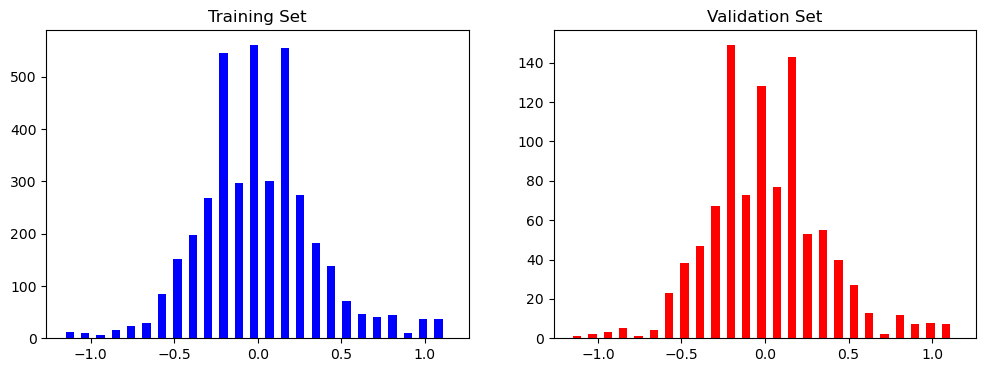

In [22]:
fig,axes = plt.subplots(1,2,figsize = (12,4))
axes[0].hist(y_train,bins=num_bins,width = 0.05,color = "blue")
axes[0].set_title("Training Set")
axes[1].hist(y_valid,bins=num_bins,width = 0.05,color = "red")
axes[1].set_title("Validation Set")


In the next steps, we normalize the data and in the nvidia model, we will have to keep it in a UAV pattern as well as slice unnecessary information. We preprocess the image too.

Zoom.The images in the dataset have relevant features in the lower part where the road is visible. The external environment above a certain image portion will never be used to determine the output and thus can be cropped. Approximately, 30% of the top portion of the image is cut and passed in the training set. The snippet of code and transformation of an image after cropping and resizing it to original image can be seen in below.

Text(0.5, 1.0, 'Zoomed Image')

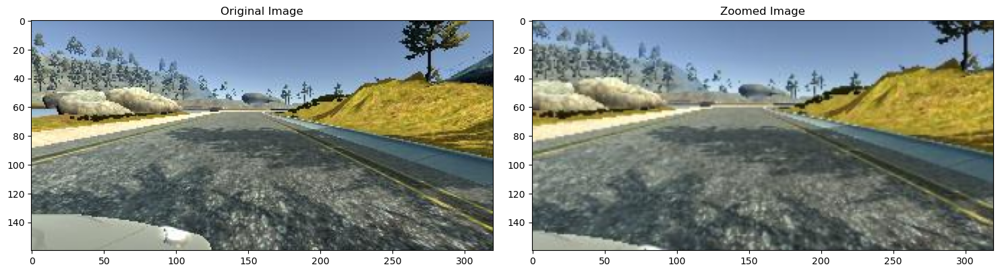

In [23]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title("Original Image")

axs[1].imshow(zoomed_image)
axs[1].set_title("Zoomed Image")




Shift(horizontal/vertical).The image is shifted by a small amount, it is vertical shift and horizontal shift as below.

Text(0.5, 1.0, 'panned_image')

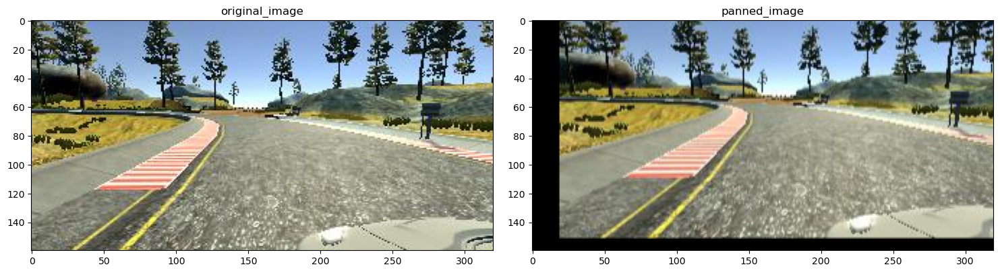

In [24]:
def pan(image):
    pan = iaa.Affine(translate_percent={"x":(-0.1,0.1),"y":(-0.1,0.1)})
    image = pan.augment_image(image)
    return image

image = image_paths[np.random.randint(0,1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig,axs = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title("original_image")

axs[1].imshow(panned_image)
axs[1].set_title("panned_image")



Brightness.To generalize to the weather conditions with bright sunny day or cloudy, lowlight conditions, the brightness augmentation can prove to be very useful. The code snippet and increase of brightness can be seen below. Similarly, I have randomly also lowered down the level of brightness for other conditions.

Text(0.5, 1.0, 'brightness_altered_image')

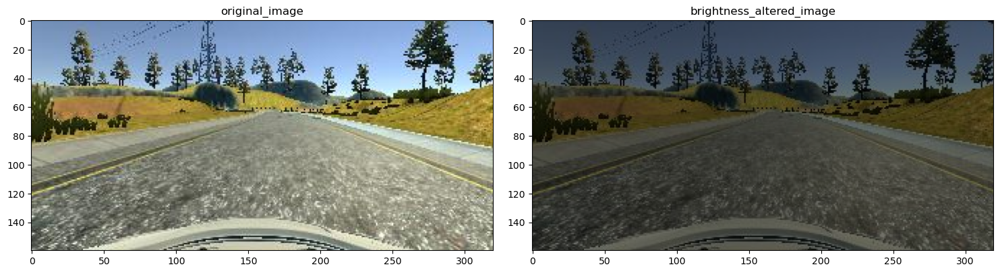

In [25]:
def random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[np.random.randint(0,1000)]
original_image = mpimg.imread(image)
brightness_altered_image = random_brightness(original_image)

fig,axs = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title("original_image")

axs[1].imshow(brightness_altered_image)
axs[1].set_title("brightness_altered_image")

Flip(horizontal).The image is flipped horizontally (i.e. a mirror image of the original image is passed to the dataset). The motive behind this is that the model gets trained for similar kinds of turns on opposite sides too. This is important because Track 1 includes only left turns. The snippet of code and transformation of an image after flipping it can be seen in below

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.0')

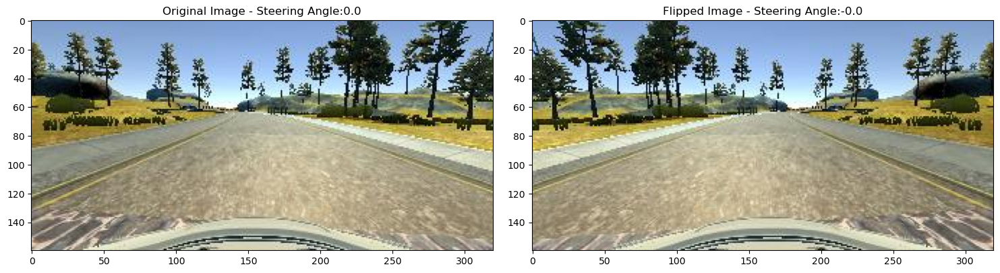

In [26]:
def random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle


random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title("Original Image - " + "Steering Angle:" + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title("Flipped Image - " + "Steering Angle:" + str(flipped_steering_angle))

To have a look what we have at this moment

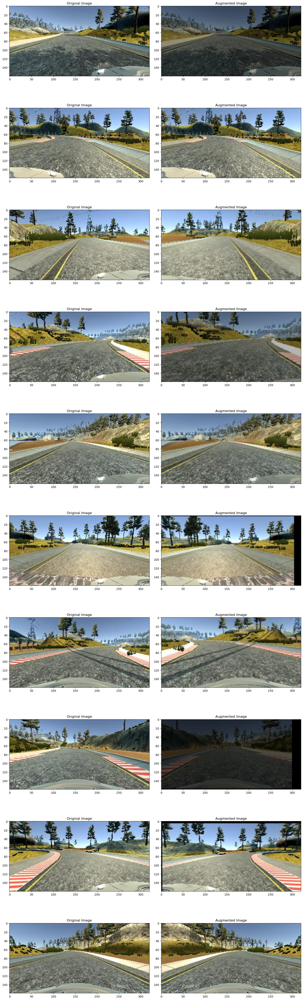

In [27]:
def random_augment(image,steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = random_brightness(image)
    if np.random.rand() < 0.5:
        image,steering_angle =random_flip(image,steering_angle)
    return image,steering_angle

ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    random_index = random.randint(0,len(image_paths)-1)
    random_image = image_paths[random_index]
    random_steering = steerings[random_index]

    original_image = mpimg.imread(random_image)
    augmented_image,steering = random_augment(random_image,random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

I continued by doing some image processing. I cropped the image to remove the unnecessary features, changes the images to YUV format, used gaussian blur, decreased the size for easier processing and normalized the values.

In [28]:
def img_preprocess(img):
    img = img[60:135, :, :]
    img = cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,(3,3),0)
    img = cv2.resize(img,(200,66))
    img = img/255
    return img

To compare and visualize I plotted the original and the pre-processed image.

Text(0.5, 1.0, 'Preprocessed Image')

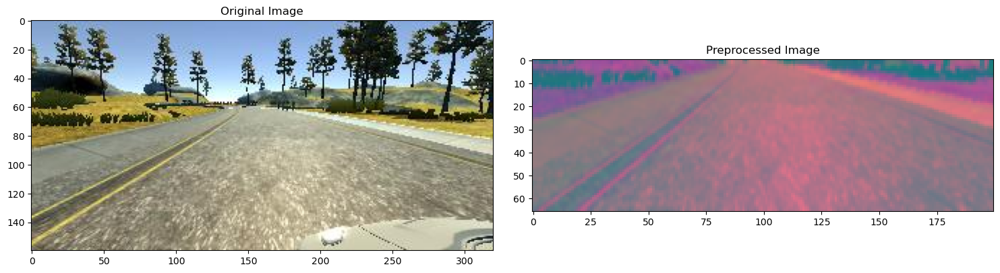

In [29]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title("Original Image")

axs[1].imshow(preprocessed_image)
axs[1].set_title("Preprocessed Image")

In [30]:
def batch_generator(image_paths,steering_ang,batch_size,istraining):
    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = np.random.randint(0,len(image_paths)-1)

            if istraining:
                im,steering = random_augment(image_paths[random_index],steering_ang[random_index])

            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
            
        yield (np.asarray(batch_img),np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation_image')

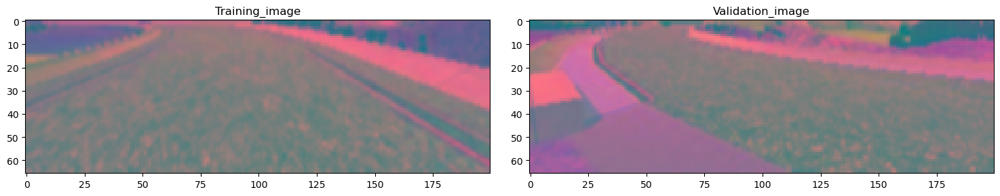

In [31]:
x_train_gen,y_train_gen = next(batch_generator(X_train,y_train,1,1))
x_valid_gen,y_valid_gen = next(batch_generator(X_valid,y_valid,1,0))

fig,axs = plt.subplots(1,2,figsize = (15,10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title("Training_image")

axs[1].imshow(x_valid_gen[0])
axs[1].set_title("Validation_image")

We will design our Model architecture. We have to classify the traffic signs too that's why we need to shift from Lenet 5 model to NVDIA model. With behavioural cloning, our dataset is much more complex then any dataset we have used. We are dealing with images that have (200,66) dimensions. Our current datset has 4923 images to train with but MNSIT has around 60,000 images to train with. Our behavioural cloning code has simply has to return appropriate steering angle which is a regression type example. For these things, we need a more advanced model which is provided by nvdia and known as nvdia model.

title

For defining the model architecture, we need to define the model object. Normalization state can be skipped as we have already normalized it. We will add the convolution layer. As compared to the model, we will organize accordingly. The Nvdia model uses 24 filters in the layer along with a kernel of size 5,5. We will introduce sub sampling. The function reflects to stride length of the kernel as it processes through an image, we have large images. Horizontal movement with 2 pixels at a time, similarly vertical movement to 2 pixels at a time. As this is the first layer, we have to define input shape of the model too i.e., (66,200,3) and the last function is an activation function that is “elu”.

Revisting the model, we see that our second layer has 36 filters with kernel size (5,5) same subsampling option with stride length of (2,2) and conclude this layer with activation ‘elu’.

According to Nvdia model, it shows we have 3 more layers in the convolutional neural network. With 48 filters, with 64 filters (3,3) kernel 64 filters (3,3) kernel Dimensions have been reduced significantly so for that we will remove subsampling from 4th and 5th layer.

Next we add a flatten layer. We will take the output array from previous convolution neural network to convert it into a one dimensional array so that it can be fed to fully connected layer to follow.

Our last convolution layer outputs an array shape of (1,18) by 64.

We end the architecture of Nvdia model with a dense layer containing a single output node which will output the predicted steering angle for our self driving car. Now we will use model.compile() to compile our architecture as this is a regression type example the metrics that we will be using will be mean squared error and optimize as Adam. We will be using relatively a low learning rate that it can help on accuracy. We will use dropout layer to avoid overfitting the data. Dropout Layer sets the input of random fraction of nodes to “0” during each update. During this, we will generate the training data as it is forced to use a variety of combination of nodes to learn from the same data. We will have to separate the convolution layer from fully connected layer with a factor of 0.5 is added so it converts 50 percent of the input to 0. We Will define the model by calling the nvdia model itself. Now we will have the model training process.To define training parameters, we will use model.fit(), we will import our training data X_Train, training data ->y_train, we have less data on the datasets we will require more epochs to be effective. We will use validation data and then use Batch size.

In [32]:

def NvidiaModel():
  model = Sequential()
  model.add(Convolution2D(24,(5,5),strides=(2,2),input_shape=(66,200,3),activation="elu"))
  model.add(Convolution2D(36,(5,5),strides=(2,2),activation="elu"))
  model.add(Convolution2D(48,(5,5),strides=(2,2),activation="elu")) 
  model.add(Convolution2D(64,(3,3),activation="elu"))   
  model.add(Convolution2D(64,(3,3),activation="elu"))
  model.add(Dropout(0.5))
  model.add(Flatten())
  model.add(Dense(100,activation="elu"))
  model.add(Dropout(0.5))
  model.add(Dense(50,activation="elu"))
  model.add(Dropout(0.5))
  model.add(Dense(10,activation="elu"))
  model.add(Dropout(0.5))
  model.add(Dense(1))
  model.compile(optimizer=Adam(learning_rate=1e-3),loss="mse")
  return model

In [33]:
model = NvidiaModel()
print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 3, 20, 64)           │          27,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 1, 18, 64)           │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1, 18, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 10)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [34]:
history = model.fit(
    batch_generator(X_train, y_train, 100, 1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_generator(X_valid, y_valid, 100, 0),
    validation_steps=200,
    verbose=1,
    shuffle=1,
)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 500s 2s/step - loss: 0.2106 - val_loss: 0.0934
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 481s 2s/step - loss: 0.1161 - val_loss: 0.0918
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 492s 2s/step - loss: 0.1079 - val_loss: 0.0828
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 497s 2s/step - loss: 0.1044 - val_loss: 0.0854
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 480s 2s/step - loss: 0.1071 - val_loss: 0.0831
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 466s 2s/step - loss: 0.1038 - val_loss: 0.0932
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 464s 2s/step - loss: 0.1026 - val_loss: 0.0806
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 463s 2s/step - loss: 0.1034 - val_loss: 0.0818
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 463s 2s/step - loss: 0.0983 - val_loss: 0.0735
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 464s 2s/step - loss: 0.1001 - val_loss: 0.0748


We can encounter dead ReLUs, which occur when a node in the neural network essentially "dies" and always outputs zero, regardless of the input. This means it stops contributing to learning, as it does not activate at all. To address this issue, we use the ELU (Exponential Linear Unit) activation function instead of ReLU.

Unlike ReLU, ELU has a non-zero output for negative inputs, which helps prevent neurons from dying. ELU allows the network to continue learning even when the input is negative, increasing the chances of recovery and overall model performance.

After building and training the model, we will plot the training history and save the model in .h5 format, which is a legacy Keras model format.

Text(0.5, 0, 'Epoch')

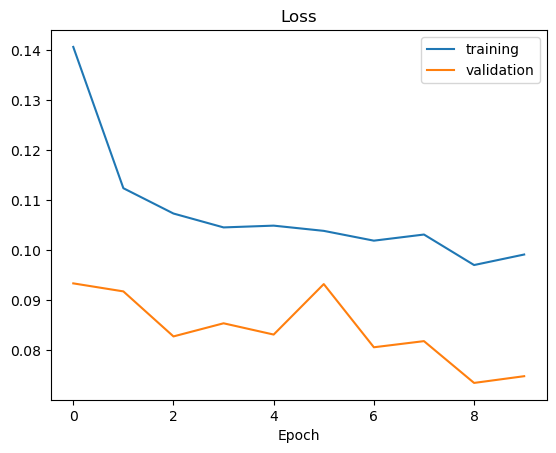

In [35]:
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["training", "validation"])
plt.title("Loss")
plt.xlabel("Epoch")

Save model

In [37]:
model.save("model.keras")
